In [1]:
import xarray as xr
import os
import fsspec
import matplotlib.pyplot as plt
import numpy as np

In [2]:
path = '/work/users/my982hzao/'

forest_mask_path = '/home/sc.uni-leipzig.de/jn906hluu/forest_mask.csv'
forest_mask_path2 = '/home/sc.uni-leipzig.de/jn906hluu/forest_mask_franconia.csv'

In [3]:
ds_resample = xr.open_zarr(fsspec.get_mapper(path + 'S2_Frankenwald.zarr'), \
                  consolidated=True)
ds_CF_20 = xr.open_zarr(fsspec.get_mapper(path + 'S2_Frankenwald_CF_20.zarr'), \
                  consolidated=True)

In [4]:
mask = ds_CF_20.isel(time = (ds_CF_20.CF == 0)).isel(time=0).mask

In [5]:
mask_csv = np.loadtxt(forest_mask_path2)
mask_csv = mask_csv & mask

In [6]:
ds_CF_20['forest_mask'] = (['lat', 'lon'], mask_csv)
ds_CF_20['forest_mask'] = ds_CF_20['forest_mask'].where(ds_CF_20['forest_mask'] > 0)
#fig, (ax1, ax2) = plt.subplots(2)
#ds_CF_20['forest_mask'].plot(ax=ax1, cmap='rainbow')

size_of_forest_clusters = np.array([np.count_nonzero(ds_CF_20['forest_mask'] == i ) for i in range(785)])


#hist, bin_edges, _ = ds_CF_20['forest_mask'].plot.hist(bins=np.arange(1,784), ax=ax2)

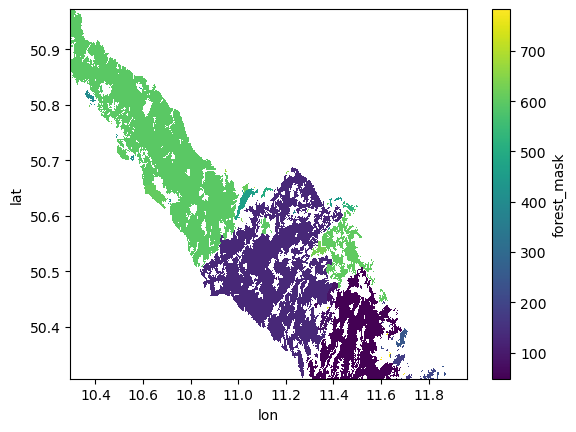

In [10]:
ds_CF_20['forest_mask'].plot()

In [8]:
big_clusters = np.where(size_of_forest_clusters > 1e5)

In [9]:
big_clusters

(array([ 48, 129, 460, 596, 604, 605]),)

In [14]:
size_of_forest_clusters.sort()
size_of_forest_clusters[::-1]

array([7080973, 6577038, 2577216,  781887,  148855,  120088,   93898,
         76734,   61594,   60286,   56095,   55190,   49666,   37590,
         30094,   23361,   22743,   21171,   17092,   12155,   11737,
          9176,    8297,    8166,    8111,    7298,    7177,    6741,
          6675,    4213,    3771,    3707,    3527,    3093,    3043,
          2870,    2601,    2572,    2551,    2521,    2516,    2335,
          1973,    1942,    1897,    1854,    1845,    1836,    1734,
          1714,    1636,    1629,    1580,    1533,    1531,    1497,
          1417,    1349,    1319,    1290,    1258,    1255,    1253,
          1243,    1242,    1234,    1194,    1115,    1099,    1083,
          1011,     993,     611,     537,     301,     223,     183,
           145,     130,       2,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,     

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


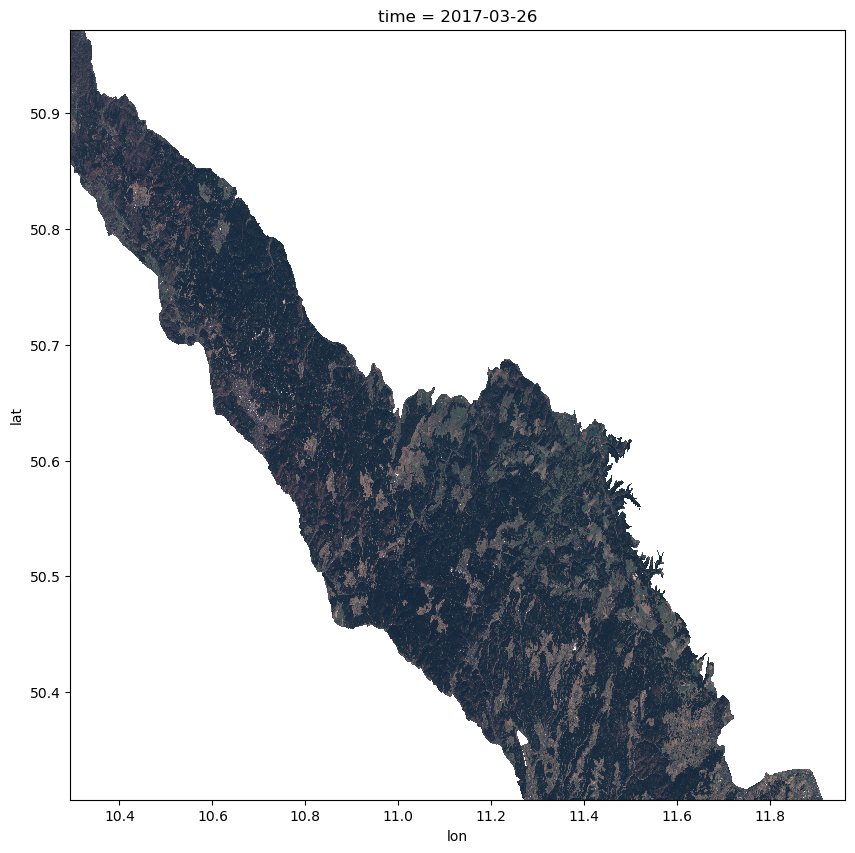

In [12]:
plt.figure(figsize=(10, 10))
RGB = (ds_CF_20['refl'].sel(band = [4, 3 ,2]) / 10000 * 3.5 )

#RGB.sel(time='2017-03-01', method='nearest').plot.imshow()
RGB.sel(time='2017-03-01', method='nearest').plot.imshow()

In [19]:
ds_CF_20['refl'] = ds_CF_20.refl.where(ds_CF_20.forest_mask)

Greenness $G$, Brightness $B$ and Wetness $W$ are defined by the tasseld cap indices: 

\begin{align}
 	G &=−0.2830 \cdot B_3−0.6600\cdot B_4+0.5770\cdot B_6+0.3880\cdot B_9 \\

	B &=0.3037\cdot B_2+0.2793\cdot B_3+0.4743\cdot B_4+0.5585\cdot B_8+0.5082\cdot B_{10}+0.1863\cdot B_{12}\\

	W &=0.1509 \cdot B_2+0.1973 \cdot B_3+0.3279 \cdot B_4+0.3406 \cdot B_8−0.7112 \cdot B_{11}−0.4572 \cdot B_{12}
\end{align}

Then, they are weighted by their means and standard deviation. Those values are exracted from a "healthy" forest scene. I would choose one of the year 2017. 

\begin{align}

B_r &= (B - B_{\mu}) / B_{\sigma} \\
W_r &= (W - W_{\mu}) / W_{\sigma} \\
G_r &= (G - G_{\mu}) / G_{\sigma} 

\end{align}

In a last step the disturbance index (DI) is computed via: 

\begin{align}

DI = B_r - (G_r + W_r)

\end{align}


In [22]:
def greeness(ds):
    return -0.283 * ds.sel(band=3) - 0.660 * ds.sel(band=4) + 0.577 * ds.sel(band=6) + 0.388 * ds.sel(band=9)

def brightness(ds):
    return 0.3037 * ds.sel(band=2) + 0.2793 * ds.sel(band=3) + 0.5585 * ds.sel(band=4) + 0.5585 * ds.sel(band=8) + 0.5082 * ds.sel(band=10) + 0.1863 * ds.sel(band=12)

def wetness(ds):
    return 0.1509 * ds.sel(band=2) + 0.1973 * ds.sel(band=3) + 0.3279 * ds.sel(band=4) + 0.3406 * ds.sel(band=8) - 0.7112 * ds.sel(band=11) - 0.4572 * ds.sel(band=12)

G_raw, B_raw, W_raw = greeness(ds_CF_20.refl), brightness(ds_CF_20.refl), wetness(ds_CF_20.refl)


G_mean = G_raw.sel(lat=slice(50.8, 50.4), lon=slice(11, 11.2)).sel(time='2017-03-01', method='nearest').mean()
G_std  = G_raw.sel(lat=slice(50.8, 50.4), lon=slice(11, 11.2)).sel(time='2017-03-01', method='nearest').std()

W_mean = W_raw.sel(lat=slice(50.8, 50.4), lon=slice(11, 11.2)).sel(time='2017-03-01', method='nearest').mean()
W_std  = W_raw.sel(lat=slice(50.8, 50.4), lon=slice(11, 11.2)).sel(time='2017-03-01', method='nearest').std()

B_mean = B_raw.sel(lat=slice(50.8, 50.4), lon=slice(11, 11.2)).sel(time='2017-03-01', method='nearest').mean()
B_std  = B_raw.sel(lat=slice(50.8, 50.4), lon=slice(11, 11.2)).sel(time='2017-03-01', method='nearest').std()

B = (B_raw - B_mean) / B_std
G = (G_raw - G_mean) / G_std
W = (W_raw - W_mean) / W_std

DI = B - (G + W)


In [23]:
reference_period = (DI.time.dt.year == 2017)
not_winter = ((DI.time.dt.month < 12) & (DI.time.dt.month > 3))

In [24]:
DI_reference = DI.isel(time=reference_period & not_winter).mean()

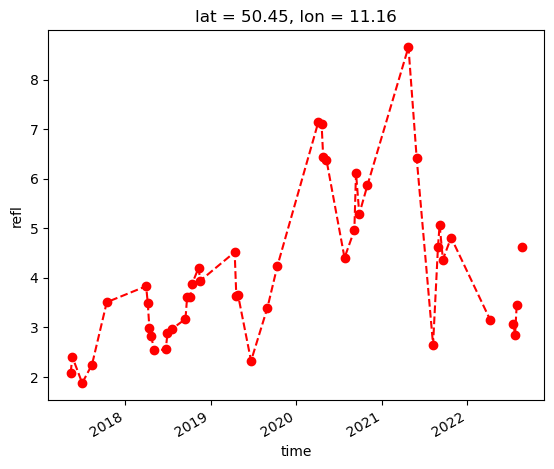

In [26]:
(DI.sel(lon=11.155, lat=50.45, method='nearest').isel(time=not_winter) - DI_reference).plot(marker='o', linestyle='--', color='r')

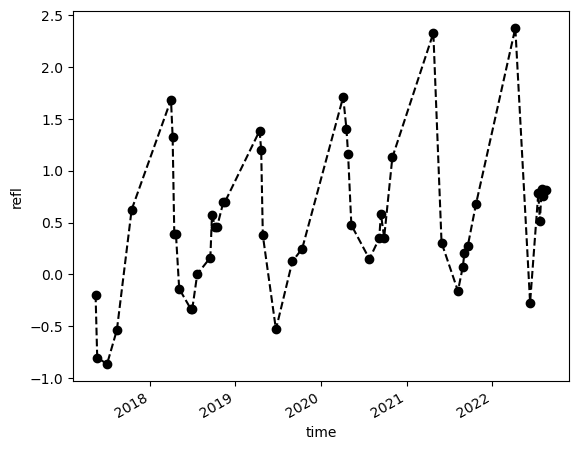

In [87]:
DI_home = DI.sel(lon=slice(11.2, 11.4), lat=slice(50.41, 50.31)).isel(time=no_winter)
(DI_home.mean(dim=['lat', 'lon']) - DI_reference).plot(marker='o', linestyle='--', color='k')

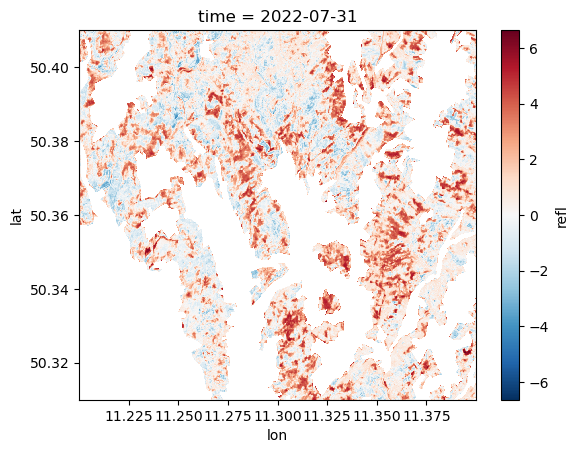

In [105]:
DI_home.isel(time=-3).plot()

In [89]:
DI_quaterly = DI_home.resample(time='3M').mean()

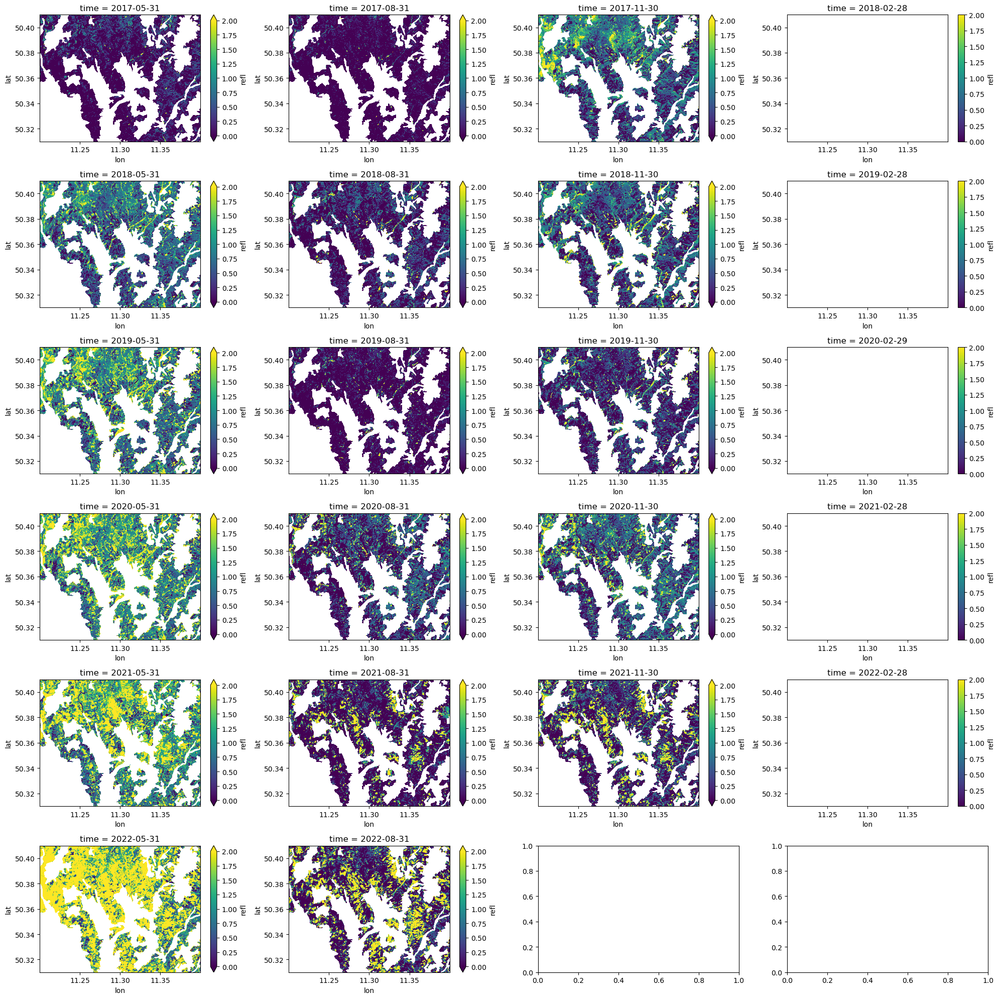

In [90]:
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

for i, ax in zip(range(22), axs.flatten()):
    DI_quaterly.isel(time=i).plot(ax=ax, cmap='viridis', vmin=0, vmax=2)
plt.tight_layout()

In [9]:
NDVI_resample = (ds_resample.sel(band=8) - ds_resample.sel(band=4)) / (ds_resample.sel(band=8) + ds_resample.sel(band=4))
NDVI_CF_20 = (ds_CF_20.sel(band=8) - ds_CF_20.sel(band=4)) / (ds_CF_20.sel(band=8) + ds_CF_20.sel(band=4))

In [13]:
NDVI_home = NDVI_CF_20.sel(lon=slice(11.2, 11.4), lat=slice(50.41, 50.31)).refl


In [36]:
def change_in_index(index):

    difference_per_timestep = np.zeros(index.shape)
    for i in range(len(index.time) - 1):
        difference_per_timestep[i+1] = index.isel(time=i) - index.isel(time=i+1)

    return difference_per_timestep 

diff_NDVI = change_in_index(NDVI_home)

In [47]:
ds_CF_20

<xarray.Dataset>
Dimensions:  (time: 68, band: 12, lat: 7530, lon: 11540)
Coordinates:
  * band     (band) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * lat      (lat) float64 50.97 50.97 50.97 50.97 ... 50.31 50.31 50.31 50.31
  * lon      (lon) float64 10.29 10.29 10.29 10.29 ... 11.96 11.96 11.96 11.96
  * time     (time) datetime64[ns] 2017-01-22 2017-03-26 ... 2022-12-11
Data variables:
    CF       (time) float64 dask.array<chunksize=(68,), meta=np.ndarray>
    mask     (time, lat, lon) int8 dask.array<chunksize=(1, 942, 1443), meta=np.ndarray>
    refl     (time, band, lat, lon) float64 dask.array<chunksize=(1, 1, 471, 1443), meta=np.ndarray>
Attributes: (12/13)
    author:                       Joshua Müller
    band_dimension:               bands
    band_scale_factor:            10000
    band_units:                   DN
    coordinate_reference_system:  EPSG:4326
    creation_date:                2023-02-13
    ...                           ...
    platform:                     Sentinel-2
    product_type:                 Level-2A
    projection:                   plane
    resolution:                   10m
    wavelength_units:             nanometers
    wavelengths:                  [443, 490, 560, 665, 705, 740, 783, 832, 94...

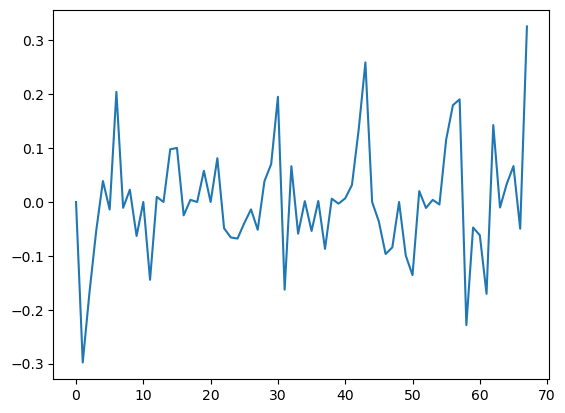

In [46]:
plt.plot([np.nanmean(diff_NDVI[i,:,:]) for i in range(68)])

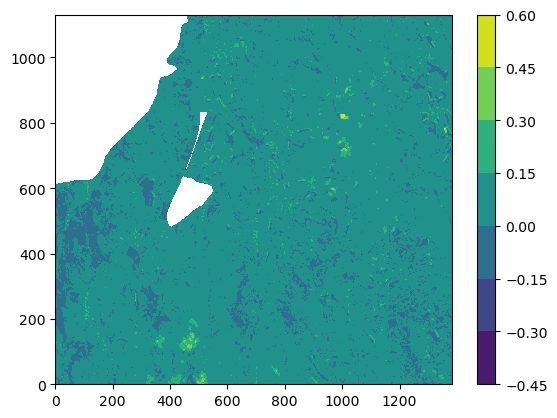

In [45]:
plt.contourf(diff_NDVI[-32,:,:])
plt.colorbar()

In [20]:
import numpy as np

In [21]:
ndvi_gradient = np.gradient(ndvi_numpy, axis=0)

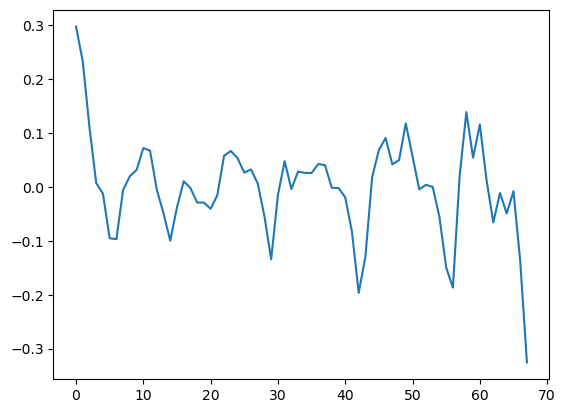

In [29]:
plt.plot([np.nanmean(ndvi_gradient[i,:,:]) for i in range(68)])

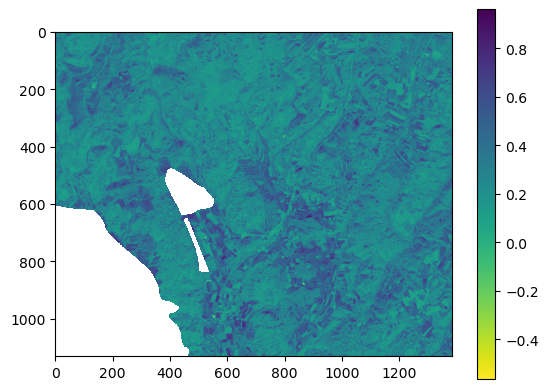

In [23]:
plt.imshow(ndvi_gradient[0,:,:], cmap='viridis_r')
plt.colorbar()

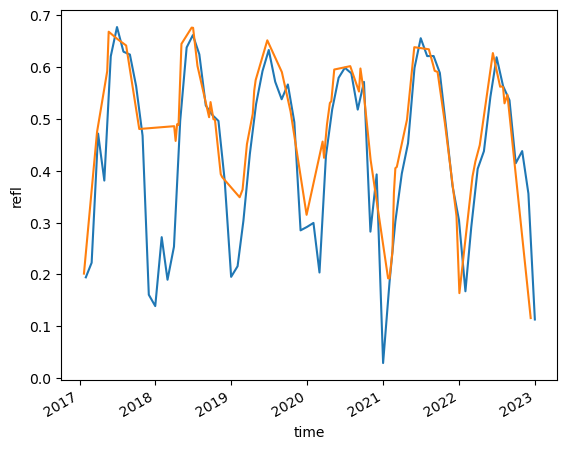

In [10]:
NDVI_resample.refl.mean(dim=['lat', 'lon']).plot()
NDVI_CF_20.refl.mean(dim=['lat', 'lon']).plot()

### Barren Soil Index (BSI)

The BSI is an index that indecates bare soil. Seems to work; ref: `https://github.com/sentinel-hub/custom-scripts/tree/master/sentinel-2/barren_soil`
\begin{align}
BSI = \frac{(B_{11} + B_4) - (B_8 + B_2)}{(B_{11} + B_4) + (B_8 + B_2)}
\end{align}

In [19]:
BSI = ((ds_resample.sel(band=11) + ds_resample.sel(band=4)) - (ds_resample.sel(band=8) + ds_resample.sel(band=2))) / ((ds_resample.sel(band=11) + ds_resample.sel(band=4)) + (ds_resample.sel(band=8) + ds_resample.sel(band=2)))

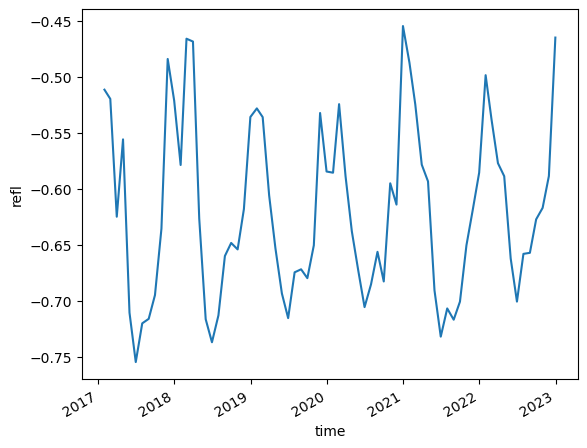

In [20]:
BSI.refl.mean(dim=['lat', 'lon']).plot()

### Selecting my hometown area...

In [12]:
NDVI_home = NDVI_CF_20.sel(lon=slice(11.2, 11.4), lat=slice(50.41, 50.31)).refl
BSI_home = BSI.sel(lon=slice(11.2, 11.4), lat=slice(50.41, 50.31)).refl

NameError: name 'BSI' is not defined

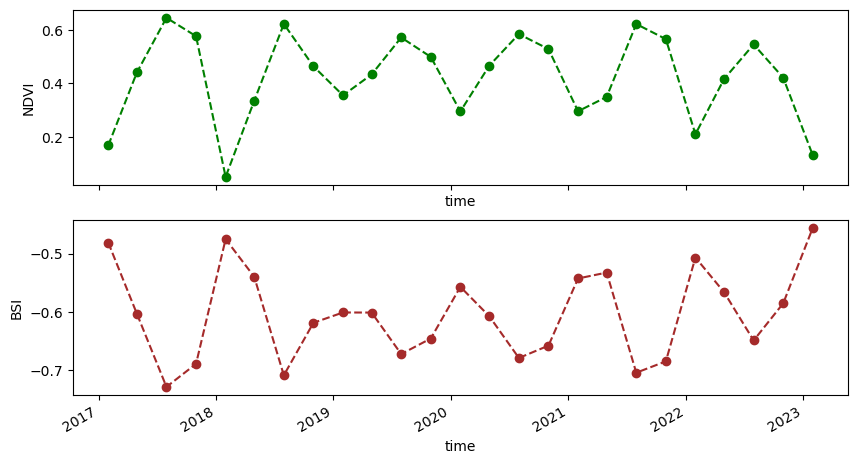

In [71]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 5), sharex=True)

NDVI_home.resample(time='3M').mean().mean(dim=['lat', 'lon']).plot(ax=ax1, marker='o', linestyle='--', color='g')
BSI_home.resample(time='3M').mean().mean(dim=['lat', 'lon']).plot(ax=ax2, marker='o', linestyle='--', color = 'brown')
ax1.set_ylabel('NDVI')
ax2.set_ylabel('BSI')
plt.show()

### And some Heatmaps of the BSI for the selected region, seems all quite promising. 

It should be noted that so far the high resolution isn't really utilized. Looking forward to acutally applying a Forestmask and seeing the NDVI changes in the Forest. 

In [61]:
BSI_home_quarterly = BSI_home.resample(time='3M').mean()

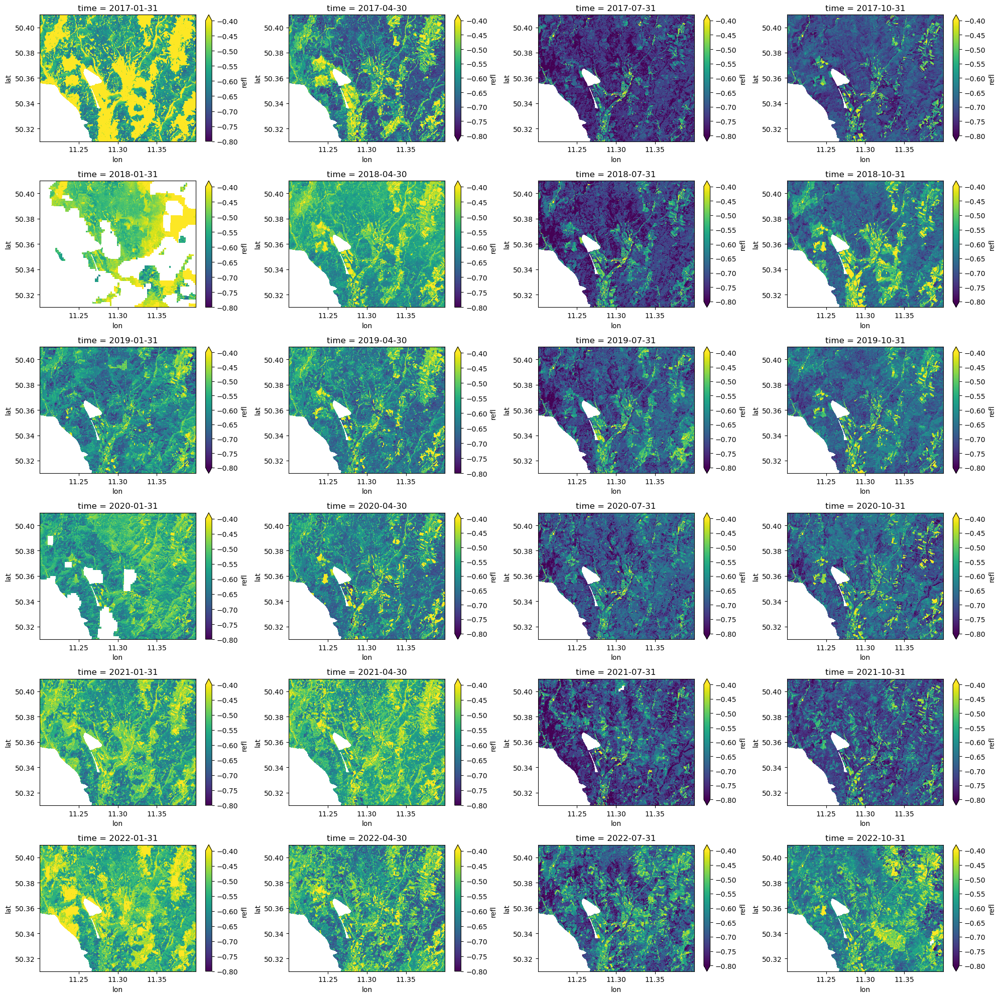

In [72]:
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

for i, ax in zip(range(24), axs.flatten()):
    BSI_home_quarterly.isel(time=i).plot(ax=ax, cmap='viridis', vmin=-0.8, vmax=-0.4)
plt.tight_layout()